# New CVID data

### Analysis based on GEX and SoupX-denoised protein

12.2020

12.02.2021: reanalysis without twins and without BCR activation data

(Preprocessing happened in notebook M1)

Step-by-step workflow - **different to the scRNA-seq integration in doublet calling**:
- load preprocessed object
- do SCTransfor instead of normalising & log transforming
- save raw attribute to then be able to plot all genes on the HVG-subsetted dataset
- filter out cell cycle genes - taking cleaned up genes from the GEX-only object and uniting with protein features
- subset to HVGs
- (skipping scaling, not necessary because we've done SCTransform)
- pca (can also do preliminary neighbors/bbknn+umap here to peak at the data)
- **train a logreg model and add annotation (before it used to be earlier in the workflow)**
- neighbors/bbknn - deciding on which batch correction we will be using
- perform **step 2** of bertie doublet calling (requires running louvain clustering, see code)
- umap
- unbiased clustering
- save

In [1]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import numpy as np
import pandas as pd
import seaborn as sns
import scanpy as sc
from glob import iglob
import anndata
# need to do 'pip3 install bbknn==1.3.8' to avoid incompatibility errors
import bbknn
# requires 'pip install scrublet'
#import scrublet as scr
import os
import sklearn
from sklearn.linear_model import LogisticRegression
import matplotlib as mpl
import scipy
import matplotlib.pyplot as plt
import pickle

/opt/conda/lib/python3.7/site-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [2]:
np.random.seed(0)

In [3]:
%%bash

pip freeze

aiohttp==3.6.2
airr==1.3.1
alembic==1.3.0
anndata==0.7.5
annoy==1.16.2
async-generator==1.10
async-timeout==3.0.1
attrs==19.3.0
backcall==0.1.0
bbknn==1.3.6
bleach==3.1.0
blinker==1.4
certifi==2019.9.11
certipy==0.1.3
cffi==1.13.2
chardet==3.0.4
Click==7.0
conda==4.7.12
conda-package-handling==1.6.0
cryptography==2.8
cycler==0.10.0
Cython==0.29.14
decorator==4.4.1
defusedxml==0.6.0
entrypoints==0.3
fbpca==1.0
geosketch==1.0
get-version==2.1
h5py==2.10.0
idna==2.8
imageio==2.9.0
importlib-metadata==0.23
intervaltree==2.1.0
ipykernel==5.1.3
ipython==7.9.0
ipython-genutils==0.2.0
jedi==0.15.1
Jinja2==2.10.3
joblib==0.14.0
json5==0.8.5
jsonschema==3.1.1
jupyter-client==5.3.3
jupyter-core==4.5.0
jupyter-rsession-proxy==1.0b6
jupyter-server-proxy==1.2.0
jupyterhub==1.0.0
jupyterlab==1.2.1
jupyterlab-server==1.0.6
kiwisolver==1.1.0
legacy-api-wrap==1.2
leidenalg==0.7.0
llvmlite==0.30.0
loompy==3.0.6
louvain==0.6.1
Mako==1.1.0
MarkupSafe==1.1.1
matplotlib==3.3.4
mistune==0.8.4
more-itertools==

In [4]:
sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()
sc.settings.set_figure_params(dpi=80)  # low dpi (dots per inch) yields small inline figures

-----
anndata     0.7.5
scanpy      1.6.0
sinfo       0.3.1
-----
PIL                 8.1.0
anndata             0.7.5
annoy               NA
attr                19.3.0
backcall            0.1.0
bbknn               NA
cffi                1.13.2
constants           NA
cycler              0.10.0
cython_runtime      NA
dateutil            2.8.1
decorator           4.4.1
get_version         2.1
h5py                2.10.0
highs_wrapper       NA
igraph              0.7.1
importlib_metadata  0.23
ipykernel           5.1.3
ipython_genutils    0.2.0
jedi                0.15.1
joblib              0.14.0
kiwisolver          1.1.0
legacy_api_wrap     1.2
leidenalg           0.7.0
llvmlite            0.30.0
louvain             0.6.1
matplotlib          3.3.4
more_itertools      NA
mpl_toolkits        NA
natsort             6.2.0
numba               0.46.0
numexpr             2.7.0
numpy               1.17.4
packaging           19.2
pandas              1.2.2
parso               0.5.1
pexpect         

In [5]:
save_path = '/lustre/scratch117/cellgen/team292/aa22/adata_objects/202009_CVID_revision/'

## Reding the preprocessed object

Preprocessing happened in M1 notebook

In [6]:
# reading
adata = sc.read(save_path+'adata_raw_filtered_validation_cohort.h5ad')

In [7]:
adata.var['feature_types-0'].value_counts()

Gene Expression     17254
nan                  4303
Antibody Capture      192
Name: feature_types-0, dtype: int64

In [8]:
# reading indices of cells that were not called as doublets
indices = pd.read_csv('cells_no_doublets_GEX_only_based_validation_cohort_20210210.csv', index_col=0)

### Reading SoupX-denoised protein data (raw)

In [9]:
samples = np.unique(adata.obs['sample'])
samples

array(['35008_CV005_RV9039258_and_35008_CV005_RV9039282',
       '35008_CV005_RV9039259_and_35008_CV005_RV9039283',
       '35008_CV005_RV9039260_and_35008_CV005_RV9039284',
       '35008_CV005_RV9039261_and_35008_CV005_RV9039285',
       '35008_CV005_RV9039262_and_35008_CV005_RV9039286',
       '35008_CV005_RV9039263_and_35008_CV005_RV9039287',
       '35171_CV005_RV9039361', '35171_CV005_RV9039362',
       '35171_CV005_RV9039363'], dtype=object)

In [10]:
# reading SoupX corrected protein counts (raw)
soupx_denoised_prot = {}

for sample in samples:
    print(sample)
    soupx_denoised_prot[sample] = pd.read_csv('/lustre/scratch117/cellgen/team292/aa22/adata_objects/202009_CVID_revision/20210212_counts_denoised_with_SoupX_sample_' + sample + '.csv',
                                             index_col=0)
    # getting the barcode indexing to look like the 'cell_id' column in the adata.obs table
    soupx_denoised_prot[sample].columns = [elem.replace('.','-') + '_' + sample for elem in soupx_denoised_prot[sample].columns]
    soupx_denoised_prot[sample].index = [elem.replace('.','-') for elem in soupx_denoised_prot[sample].index]
    soupx_denoised_prot[sample] = soupx_denoised_prot[sample].T

35008_CV005_RV9039258_and_35008_CV005_RV9039282
35008_CV005_RV9039259_and_35008_CV005_RV9039283
35008_CV005_RV9039260_and_35008_CV005_RV9039284
35008_CV005_RV9039261_and_35008_CV005_RV9039285
35008_CV005_RV9039262_and_35008_CV005_RV9039286
35008_CV005_RV9039263_and_35008_CV005_RV9039287
35171_CV005_RV9039361
35171_CV005_RV9039362
35171_CV005_RV9039363


In [11]:
soupx_denoised_prot['35008_CV005_RV9039258_and_35008_CV005_RV9039282']

,CD80-1,CD86-1,CD274(B7-H1),CD273(B7-DC),CD275(B7-H2),CD11b,CD252(OX40L),CD137L(4-1BBLigand),CD155(PVR),CD112(Nectin-2),...,CD101(BB27),CD360(IL-21R),CD88(C5aR),HLA-F-1,NLRP2-1,Podocalyxin,CD224,anti-c-Met,CD258(LIGHT),DR3(TRAMP)
AAACCTGAGAATGTGT-1_35008_CV005_RV9039258_and_35008_CV005_RV9039282,0.000000,1.533831,0.000000,0.000000,0.000000,17.246043,0.000000,2.002305,2.248118,4.232278,...,10.184110,0.500351,32.863840,0.000000,0.000000,0.000000,4.667795,0.000000,0.000000,0.000000
AAACCTGAGACTAAGT-1_35008_CV005_RV9039258_and_35008_CV005_RV9039282,1.655727,2.826156,0.000000,2.254152,0.000000,0.000000,0.000000,0.000000,3.248333,0.000000,...,10.629308,0.000000,9.392276,0.000000,0.000000,0.000000,10.429329,0.000000,0.000000,0.000000
AAACCTGAGCCGCCTA-1_35008_CV005_RV9039258_and_35008_CV005_RV9039282,0.000000,0.000000,0.805469,2.115785,0.000000,0.865683,0.372383,0.000000,0.000000,0.000000,...,5.758597,1.175540,0.000000,0.000000,1.474611,0.000000,0.904696,0.772919,0.000000,0.618679
AAACCTGAGCGCCTCA-1_35008_CV005_RV9039258_and_35008_CV005_RV9039282,0.000000,0.000000,0.000000,0.000000,0.153741,2.645492,0.412204,0.043668,0.000000,0.000000,...,0.576866,0.000000,0.000000,0.000000,2.484107,0.000000,0.000000,0.000000,0.000000,0.000000
AAACCTGAGGATGTAT-1_35008_CV005_RV9039258_and_35008_CV005_RV9039282,0.000000,0.000000,2.006234,0.000000,0.194955,0.808861,0.000000,0.000000,0.000000,0.000000,...,4.694875,0.000000,0.000000,0.000000,0.000000,0.188552,0.000000,0.875976,0.000000,0.709547
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCATCGTACCGG-1_35008_CV005_RV9039258_and_35008_CV005_RV9039282,0.000000,0.000000,0.000000,0.793204,2.604445,4.722219,0.000000,0.000000,0.000000,0.619657,...,0.000000,0.874759,0.000000,0.365753,0.918117,0.000000,0.000000,0.325254,1.621953,0.000000
TTTGTCATCGTTGCCT-1_35008_CV005_RV9039258_and_35008_CV005_RV9039282,0.209406,0.000000,0.000000,0.000000,0.000000,2.006291,0.314774,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,1.852920,0.000000,0.000000,0.160946,0.780172,0.000000,0.545077
TTTGTCATCTCAAGTG-1_35008_CV005_RV9039258_and_35008_CV005_RV9039282,0.000000,2.788698,1.021803,0.325714,0.596336,0.000000,0.000000,0.000000,0.000000,0.000000,...,3.053127,2.018101,7.830450,0.000000,0.000000,0.000000,2.637211,0.000000,0.000000,0.000000
TTTGTCATCTCTGAGA-1_35008_CV005_RV9039258_and_35008_CV005_RV9039282,1.083752,0.000000,0.000000,0.000000,0.830931,1.416465,0.282431,0.000000,0.000000,0.843674,...,0.000000,0.000000,0.000000,0.000000,0.255989,0.000000,2.747715,0.000000,0.000000,0.000000


In [12]:
soupx_denoised_prot_joint_table = pd.concat(list(soupx_denoised_prot.values()))

In [13]:
soupx_denoised_prot_joint_table

,CD80-1,CD86-1,CD274(B7-H1),CD273(B7-DC),CD275(B7-H2),CD11b,CD252(OX40L),CD137L(4-1BBLigand),CD155(PVR),CD112(Nectin-2),...,CD101(BB27),CD360(IL-21R),CD88(C5aR),HLA-F-1,NLRP2-1,Podocalyxin,CD224,anti-c-Met,CD258(LIGHT),DR3(TRAMP)
AAACCTGAGAATGTGT-1_35008_CV005_RV9039258_and_35008_CV005_RV9039282,0.000000,1.533831,0.000000,0.000000,0.000000,17.246043,0.000000,2.002305,2.248118,4.232278,...,10.184110,0.500351,32.863840,0.000000,0.000000,0.000000,4.667795,0.000000,0.000000,0.000000
AAACCTGAGACTAAGT-1_35008_CV005_RV9039258_and_35008_CV005_RV9039282,1.655727,2.826156,0.000000,2.254152,0.000000,0.000000,0.000000,0.000000,3.248333,0.000000,...,10.629308,0.000000,9.392276,0.000000,0.000000,0.000000,10.429329,0.000000,0.000000,0.000000
AAACCTGAGCCGCCTA-1_35008_CV005_RV9039258_and_35008_CV005_RV9039282,0.000000,0.000000,0.805469,2.115785,0.000000,0.865683,0.372383,0.000000,0.000000,0.000000,...,5.758597,1.175540,0.000000,0.000000,1.474611,0.000000,0.904696,0.772919,0.000000,0.618679
AAACCTGAGCGCCTCA-1_35008_CV005_RV9039258_and_35008_CV005_RV9039282,0.000000,0.000000,0.000000,0.000000,0.153741,2.645492,0.412204,0.043668,0.000000,0.000000,...,0.576866,0.000000,0.000000,0.000000,2.484107,0.000000,0.000000,0.000000,0.000000,0.000000
AAACCTGAGGATGTAT-1_35008_CV005_RV9039258_and_35008_CV005_RV9039282,0.000000,0.000000,2.006234,0.000000,0.194955,0.808861,0.000000,0.000000,0.000000,0.000000,...,4.694875,0.000000,0.000000,0.000000,0.000000,0.188552,0.000000,0.875976,0.000000,0.709547
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCATCCCTTGCA-1_35171_CV005_RV9039363,4.751022,0.000000,0.000000,0.000000,0.000000,5.935854,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,12.065276,5.615428,0.000000,0.000000,31.023987,0.985559,2.577475,0.000000
TTTGTCATCCGCGTTT-1_35171_CV005_RV9039363,2.012104,0.283824,0.000000,2.011435,0.000000,2.706799,0.000000,4.369925,0.000000,1.209127,...,0.000000,0.382284,0.000000,1.571716,5.859170,0.000000,0.000000,0.000000,4.095515,2.392394
TTTGTCATCGGAGGTA-1_35171_CV005_RV9039363,3.016310,0.000000,0.000000,0.000000,0.125238,0.717997,0.000000,0.375489,0.031817,0.215031,...,0.000000,0.385706,0.000000,0.000000,11.872162,0.151275,0.000000,0.000000,5.099544,1.402142
TTTGTCATCGGCTACG-1_35171_CV005_RV9039363,2.160729,0.000000,0.000000,0.000000,4.452726,12.631291,1.152827,0.651164,1.339122,0.823337,...,0.000000,1.692116,6.579794,1.646557,0.000000,0.000000,0.000000,5.316219,4.508857,5.464297


In [14]:
adata_protein = adata[:,adata.var['feature_types-0'] == 'Antibody Capture'].copy()

In [15]:
for Ab in list(adata_protein.var_names):
    if 'TCR' in Ab:
        print(Ab)

TCR
TCRa/B
TCRVa7.2
TCRVd2
TCRV?9
TCRVa24-Ja18(iNKTcell)
TCR-1


In [16]:
for Ab in list(soupx_denoised_prot_joint_table.columns):
    if 'TCR' in Ab:
        print(Ab)

TCR
TCRa/B
TCRVa7-2
TCRVd2
TCRV?9
TCRVa24-Ja18(iNKTcell)
TCR-1


In [17]:
soupx_denoised_prot_joint_table.columns = [col if col != 'TCRVa7-2' else 'TCRVa7.2' for col in soupx_denoised_prot_joint_table.columns]

In [18]:
soupx_denoised_prot_joint_table = soupx_denoised_prot_joint_table[list(adata_protein.var_names)]

In [19]:
list(adata_protein.var_names)

['CD80-1',
 'CD86-1',
 'CD274(B7-H1)',
 'CD273(B7-DC)',
 'CD275(B7-H2)',
 'CD11b',
 'CD252(OX40L)',
 'CD137L(4-1BBLigand)',
 'CD155(PVR)',
 'CD112(Nectin-2)',
 'CD47-1',
 'CD70-1',
 'CD30',
 'CD40-1',
 'CD154',
 'CD52-1',
 'CD3',
 'CD8',
 'CD56(NCAM)',
 'CD19-1',
 'CD33-1',
 'CD11c',
 'CD34-1',
 'CD269(BCMA)',
 'HLA-ABC',
 'CD90(Thy1)',
 'CD117(c-kit)',
 'CD10',
 'CD45RA',
 'CD123',
 'CD7-1',
 'CD49f',
 'CD194(CCR4)',
 'CD4-1',
 'CD44-1',
 'CD14-1',
 'CD16',
 'CD25',
 'CD45RO',
 'CD279(PD-1)',
 'TIGIT(VSTM3)',
 'Mouse_IgG1',
 'Mouse_IgG2a',
 'Mouse_IgG2b',
 'Rat_IgG2b',
 'CD20',
 'CD335(NKp46)',
 'CD294(CRTH2)',
 'CD326(Ep-CAM)',
 'CD31',
 'Podoplanin',
 'CD146',
 'CD324(E-Cadherin)',
 'IgM',
 'CD5-1',
 'TCR',
 'CD183(CXCR3)',
 'CD195(CCR5)',
 'CD32',
 'CD196(CCR6)',
 'CD185(CXCR5)',
 'CD103(IntegrinaE)',
 'CD69-1',
 'CD62L',
 'CD197(CCR7)',
 'CD161',
 'CD152(CTLA-4)',
 'CD223(LAG-3)',
 'KLRG1(MAFA)',
 'CD27-1',
 'CD107a(LAMP-1)',
 'CD95(Fas)',
 'HLA-DR',
 'CD1c',
 'CD64',
 'CD141(Thro

In [20]:
soupx_denoised_prot_joint_table = soupx_denoised_prot_joint_table.loc[adata.obs['cell_id'],:]

/opt/conda/lib/python3.7/site-packages/pandas/core/indexing.py:1418: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#deprecate-loc-reindex-listlike
  return self._getitem_tuple(key)


In [21]:
# are indices the same?
np.unique(soupx_denoised_prot_joint_table.index == adata.obs['cell_id'])

array([ True])

In [24]:
indices['index']

0           AAACCTGAGAATGTGT-1
1           AAACCTGAGACTAAGT-1
2           AAACCTGAGCCGCCTA-1
3           AAACCTGAGCGCCTCA-1
4           AAACCTGAGGATGTAT-1
                  ...         
107045    TTTGTCATCCCTTGCA-1-1
107046      TTTGTCATCCGCGTTT-1
107047      TTTGTCATCGGAGGTA-1
107048    TTTGTCATCGGCTACG-1-1
107049      TTTGTCATCTTGGGTA-1
Name: index, Length: 107050, dtype: object

In [25]:
# subsetting the adata to non-doublet cells
adata = adata[list(indices['index']),:].copy()

In [26]:
adata.obs

,batch,bh_pval,cell_id,dataset,n_counts,n_genes,percent_mito,sample,scrublet_cluster_score,scrublet_score,stimulation,technique,is_doublet,donor
index,,,,,,,,,,,,,,
AAACCTGAGAATGTGT-1,0,0.889727,AAACCTGAGAATGTGT-1_35008_CV005_RV9039258_and_3...,GEX+CITE-seq,7290.0,2702,0.018107,35008_CV005_RV9039258_and_35008_CV005_RV9039282,0.121951,0.228916,unstim,10X,False,CVID3
AAACCTGAGACTAAGT-1,0,0.889727,AAACCTGAGACTAAGT-1_35008_CV005_RV9039258_and_3...,GEX+CITE-seq,12742.0,3009,0.039083,35008_CV005_RV9039258_and_35008_CV005_RV9039282,0.101341,0.109890,unstim,10X,False,CONTROL4
AAACCTGAGCCGCCTA-1,0,0.889727,AAACCTGAGCCGCCTA-1_35008_CV005_RV9039258_and_3...,GEX+CITE-seq,1274.0,630,0.039246,35008_CV005_RV9039258_and_35008_CV005_RV9039282,0.097384,0.045720,unstim,10X,False,CVID3
AAACCTGAGCGCCTCA-1,0,0.889727,AAACCTGAGCGCCTCA-1_35008_CV005_RV9039258_and_3...,GEX+CITE-seq,1137.0,629,0.028144,35008_CV005_RV9039258_and_35008_CV005_RV9039282,0.081753,0.142056,unstim,10X,False,CVID33
AAACCTGAGGATGTAT-1,0,0.889727,AAACCTGAGGATGTAT-1_35008_CV005_RV9039258_and_3...,GEX+CITE-seq,1045.0,571,0.015311,35008_CV005_RV9039258_and_35008_CV005_RV9039282,0.072961,0.044019,unstim,10X,False,CVID3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCATCCCTTGCA-1-1,8,0.871054,TTTGTCATCCCTTGCA-1_35171_CV005_RV9039363,GEX+CITE-seq,10308.0,2240,0.052581,35171_CV005_RV9039363,0.097230,0.584296,CD3,10X,False,CVID25
TTTGTCATCCGCGTTT-1,8,0.949569,TTTGTCATCCGCGTTT-1_35171_CV005_RV9039363,GEX+CITE-seq,3022.0,1066,0.014229,35171_CV005_RV9039363,0.076029,0.024129,CD3,10X,False,CVID23
TTTGTCATCGGAGGTA-1,8,0.949569,TTTGTCATCGGAGGTA-1_35171_CV005_RV9039363,GEX+CITE-seq,3058.0,1076,0.010137,35171_CV005_RV9039363,0.038408,0.020513,CD3,10X,False,CVID25


In [27]:
soupx_denoised_prot_joint_table = soupx_denoised_prot_joint_table.loc[adata.obs['cell_id'],:]

In [28]:
soupx_denoised_prot_joint_table

,CD80-1,CD86-1,CD274(B7-H1),CD273(B7-DC),CD275(B7-H2),CD11b,CD252(OX40L),CD137L(4-1BBLigand),CD155(PVR),CD112(Nectin-2),...,CD101(BB27),CD360(IL-21R),CD88(C5aR),HLA-F-1,NLRP2-1,Podocalyxin,CD224,anti-c-Met,CD258(LIGHT),DR3(TRAMP)
AAACCTGAGAATGTGT-1_35008_CV005_RV9039258_and_35008_CV005_RV9039282,0.000000,1.533831,0.000000,0.000000,0.000000,17.246043,0.000000,2.002305,2.248118,4.232278,...,10.184110,0.500351,32.863840,0.000000,0.000000,0.000000,4.667795,0.000000,0.000000,0.000000
AAACCTGAGACTAAGT-1_35008_CV005_RV9039258_and_35008_CV005_RV9039282,1.655727,2.826156,0.000000,2.254152,0.000000,0.000000,0.000000,0.000000,3.248333,0.000000,...,10.629308,0.000000,9.392276,0.000000,0.000000,0.000000,10.429329,0.000000,0.000000,0.000000
AAACCTGAGCCGCCTA-1_35008_CV005_RV9039258_and_35008_CV005_RV9039282,0.000000,0.000000,0.805469,2.115785,0.000000,0.865683,0.372383,0.000000,0.000000,0.000000,...,5.758597,1.175540,0.000000,0.000000,1.474611,0.000000,0.904696,0.772919,0.000000,0.618679
AAACCTGAGCGCCTCA-1_35008_CV005_RV9039258_and_35008_CV005_RV9039282,0.000000,0.000000,0.000000,0.000000,0.153741,2.645492,0.412204,0.043668,0.000000,0.000000,...,0.576866,0.000000,0.000000,0.000000,2.484107,0.000000,0.000000,0.000000,0.000000,0.000000
AAACCTGAGGATGTAT-1_35008_CV005_RV9039258_and_35008_CV005_RV9039282,0.000000,0.000000,2.006234,0.000000,0.194955,0.808861,0.000000,0.000000,0.000000,0.000000,...,4.694875,0.000000,0.000000,0.000000,0.000000,0.188552,0.000000,0.875976,0.000000,0.709547
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCATCCCTTGCA-1_35171_CV005_RV9039363,4.751022,0.000000,0.000000,0.000000,0.000000,5.935854,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,12.065276,5.615428,0.000000,0.000000,31.023987,0.985559,2.577475,0.000000
TTTGTCATCCGCGTTT-1_35171_CV005_RV9039363,2.012104,0.283824,0.000000,2.011435,0.000000,2.706799,0.000000,4.369925,0.000000,1.209127,...,0.000000,0.382284,0.000000,1.571716,5.859170,0.000000,0.000000,0.000000,4.095515,2.392394
TTTGTCATCGGAGGTA-1_35171_CV005_RV9039363,3.016310,0.000000,0.000000,0.000000,0.125238,0.717997,0.000000,0.375489,0.031817,0.215031,...,0.000000,0.385706,0.000000,0.000000,11.872162,0.151275,0.000000,0.000000,5.099544,1.402142
TTTGTCATCGGCTACG-1_35171_CV005_RV9039363,2.160729,0.000000,0.000000,0.000000,4.452726,12.631291,1.152827,0.651164,1.339122,0.823337,...,0.000000,1.692116,6.579794,1.646557,0.000000,0.000000,0.000000,5.316219,4.508857,5.464297


In [29]:
mtx_to_add = np.nan_to_num(soupx_denoised_prot_joint_table.values)
mtx_to_add = scipy.sparse.csr_matrix(mtx_to_add)

In [30]:
mtx_to_add

<107050x192 sparse matrix of type '<class 'numpy.float64'>'
	with 7174212 stored elements in Compressed Sparse Row format>

In [31]:
adata[:,adata.var['feature_types-0'] == 'Antibody Capture'].X

<107050x192 sparse matrix of type '<class 'numpy.float32'>'
	with 16199710 stored elements in Compressed Sparse Row format>

In [32]:
adata[:,adata.var['feature_types-0'] == 'Antibody Capture'].X = mtx_to_add

In [33]:
adata

AnnData object with n_obs × n_vars = 107050 × 21749
    obs: 'batch', 'bh_pval', 'cell_id', 'dataset', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'stimulation', 'technique', 'is_doublet', 'donor'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7', 'gene_ids-8', 'feature_types-8', 'genome-8', 'n_cells-8'

In [34]:
# to gain donor information reading preliminarily analysed object
adata_prelim = sc.read(save_path+'adata_hvg_BBKNN_GEX_only_fully_proc_prelim_annot_validation_cohort_20210212.h5ad')

In [35]:
adata_prelim

AnnData object with n_obs × n_vars = 107050 × 2791
    obs: 'batch', 'bh_pval', 'cell_id', 'dataset', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'stimulation', 'technique', 'is_doublet', 'donor', 'S_score', 'G2M_score', 'phase', 'probabilities', 'celltype_predictions', 'louvain', 'louvain_R_16', 'louvain_R_4', 'louvain_R_11', 'louvain_R_3', 'louvain_R_17', 'barcode', 'prelim_annot'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7', 'gene_ids-8', 'feature_types-8', 'genome-8', 'n_cells-8', 'highly_variable', 'means', 'dispe

In [36]:
# adding metadata

cols2add = ['donor','prelim_annot','celltype_predictions','probabilities']
for col in cols2add:
    print(col)
    adata.obs[col] = adata_prelim.obs.loc[adata.obs.index, col]

donor
prelim_annot
celltype_predictions
probabilities


In [37]:
np.unique(adata.obs['sample'])

array(['35008_CV005_RV9039258_and_35008_CV005_RV9039282',
       '35008_CV005_RV9039259_and_35008_CV005_RV9039283',
       '35008_CV005_RV9039260_and_35008_CV005_RV9039284',
       '35008_CV005_RV9039261_and_35008_CV005_RV9039285',
       '35008_CV005_RV9039262_and_35008_CV005_RV9039286',
       '35008_CV005_RV9039263_and_35008_CV005_RV9039287',
       '35171_CV005_RV9039361', '35171_CV005_RV9039362',
       '35171_CV005_RV9039363'], dtype=object)

In [38]:
adata_GEX_check = adata[:, adata.var['feature_types-0'] != 'Antibody Capture'].copy()
adata_protein_check = adata[:, adata.var['feature_types-0'] == 'Antibody Capture'].copy()


In [39]:
# quick check to see if the values are integer
expr_mtx_gex = adata_GEX_check[adata_GEX_check.obs['sample'] == '35171_CV005_RV9039361'].X.todense()
np.unique(expr_mtx_gex)

matrix([[   0.,    0.,    0., ..., 6624., 7759., 7780.]], dtype=float32)

In [40]:
# quick check to see if the values are integer
expr_mtx_protein = adata_protein_check[adata_protein_check.obs['sample'] == '35171_CV005_RV9039361'].X.todense()
np.unique(expr_mtx_protein)

matrix([[    0.   ,     0.   ,     0.   , ..., 32472.53 , 33553.68 ,
         45594.797]], dtype=float32)

### So the denoised protein values are not integer after SoupX, but GEX is, so everything is fine, moving on.

___________

Carrying on to 
- Normalise and log transform
- Save raw attribute to then be able to plot all genes on the HVG-subsetted dataset
- Make cell names (obs) and gene names (var) unique

In [41]:
# normalise and log transform
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)
sc.pp.log1p(adata)

# saving the raw attribute
adata.raw = adata.copy()

adata.var_names_make_unique()
adata.obs_names_make_unique()

normalizing by total count per cell
    finished (0:00:35): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


Second step of bertie doublet removal - will be done later in the pipeline

_____________________________________________________________________________________________________________________________________________________________

### Filter Cell cycle genes 

Getting the GEX-only based cleaned up genes (CC-asssociated genes removed), taking those and adding protein

In [42]:
genes_no_ccg = pd.read_csv('./genes_no_CC_associated_genes_new_20210209.csv', index_col=0)

In [43]:
genes_no_ccg

,index
0,RP11-34P13.7
1,FO538757.2
2,AP006222.2
3,RP4-669L17.10
4,RP5-857K21.4
...,...
21454,CTD-2541M15.3
21455,THEGL
21456,KIAA1644
21457,RP11-132A1.3


In [44]:
adata_protein

AnnData object with n_obs × n_vars = 112463 × 192
    obs: 'batch', 'bh_pval', 'cell_id', 'dataset', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'stimulation', 'technique', 'is_doublet', 'donor'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7', 'gene_ids-8', 'feature_types-8', 'genome-8', 'n_cells-8'

In [45]:
Abs = list(adata_protein.var_names)
Abs

['CD80-1',
 'CD86-1',
 'CD274(B7-H1)',
 'CD273(B7-DC)',
 'CD275(B7-H2)',
 'CD11b',
 'CD252(OX40L)',
 'CD137L(4-1BBLigand)',
 'CD155(PVR)',
 'CD112(Nectin-2)',
 'CD47-1',
 'CD70-1',
 'CD30',
 'CD40-1',
 'CD154',
 'CD52-1',
 'CD3',
 'CD8',
 'CD56(NCAM)',
 'CD19-1',
 'CD33-1',
 'CD11c',
 'CD34-1',
 'CD269(BCMA)',
 'HLA-ABC',
 'CD90(Thy1)',
 'CD117(c-kit)',
 'CD10',
 'CD45RA',
 'CD123',
 'CD7-1',
 'CD49f',
 'CD194(CCR4)',
 'CD4-1',
 'CD44-1',
 'CD14-1',
 'CD16',
 'CD25',
 'CD45RO',
 'CD279(PD-1)',
 'TIGIT(VSTM3)',
 'Mouse_IgG1',
 'Mouse_IgG2a',
 'Mouse_IgG2b',
 'Rat_IgG2b',
 'CD20',
 'CD335(NKp46)',
 'CD294(CRTH2)',
 'CD326(Ep-CAM)',
 'CD31',
 'Podoplanin',
 'CD146',
 'CD324(E-Cadherin)',
 'IgM',
 'CD5-1',
 'TCR',
 'CD183(CXCR3)',
 'CD195(CCR5)',
 'CD32',
 'CD196(CCR6)',
 'CD185(CXCR5)',
 'CD103(IntegrinaE)',
 'CD69-1',
 'CD62L',
 'CD197(CCR7)',
 'CD161',
 'CD152(CTLA-4)',
 'CD223(LAG-3)',
 'KLRG1(MAFA)',
 'CD27-1',
 'CD107a(LAMP-1)',
 'CD95(Fas)',
 'HLA-DR',
 'CD1c',
 'CD64',
 'CD141(Thro

In [46]:
cleaned_up_genes = list(genes_no_ccg['index'])

In [47]:
# subsetting to cleaned up genes (based on GEX-only analysis) and protein features
adata = adata[:,cleaned_up_genes + Abs].copy()


In [48]:
adata

AnnData object with n_obs × n_vars = 107050 × 21651
    obs: 'batch', 'bh_pval', 'cell_id', 'dataset', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'stimulation', 'technique', 'is_doublet', 'donor', 'prelim_annot', 'celltype_predictions', 'probabilities'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7', 'gene_ids-8', 'feature_types-8', 'genome-8', 'n_cells-8'
    uns: 'log1p'

In [49]:
%%time
# Assign cell cycle stage & scores
cell_cycle_genes = [x.strip() for x in open(file='/home/jovyan/notebooks/Vento_Lab/regev_lab_cell_cycle_genes_from_Luz_20200505.txt')]
s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]
s_genes = [x for x in s_genes if x in adata.var_names]
g2m_genes = [x for x in g2m_genes if x in adata.var_names]
sc.tl.score_genes_cell_cycle(adata, s_genes=s_genes, g2m_genes=g2m_genes)

# takes a few minutes

calculating cell cycle phase
computing score 'S_score'
    finished: added
    'S_score', score of gene set (adata.obs).
    388 total control genes are used. (0:01:11)
computing score 'G2M_score'
    finished: added
    'G2M_score', score of gene set (adata.obs).
    464 total control genes are used. (0:01:01)
-->     'phase', cell cycle phase (adata.obs)
CPU times: user 5.92 s, sys: 2min 7s, total: 2min 13s
Wall time: 2min 13s


In [50]:
adata

AnnData object with n_obs × n_vars = 107050 × 21651
    obs: 'batch', 'bh_pval', 'cell_id', 'dataset', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'stimulation', 'technique', 'is_doublet', 'donor', 'prelim_annot', 'celltype_predictions', 'probabilities', 'S_score', 'G2M_score', 'phase'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7', 'gene_ids-8', 'feature_types-8', 'genome-8', 'n_cells-8'
    uns: 'log1p'

In [51]:
adata.var['feature_types-0'].value_counts()

Gene Expression     17157
nan                  4302
Antibody Capture      192
Name: feature_types-0, dtype: int64

_______________________________________________________________________________________________________

# Subsetting to HVGs and scaling

In [52]:
%%time
#adata_gex = adata.copy()
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

extracting highly variable genes
    finished (0:00:23)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
CPU times: user 6.22 s, sys: 17.3 s, total: 23.5 s
Wall time: 23.5 s


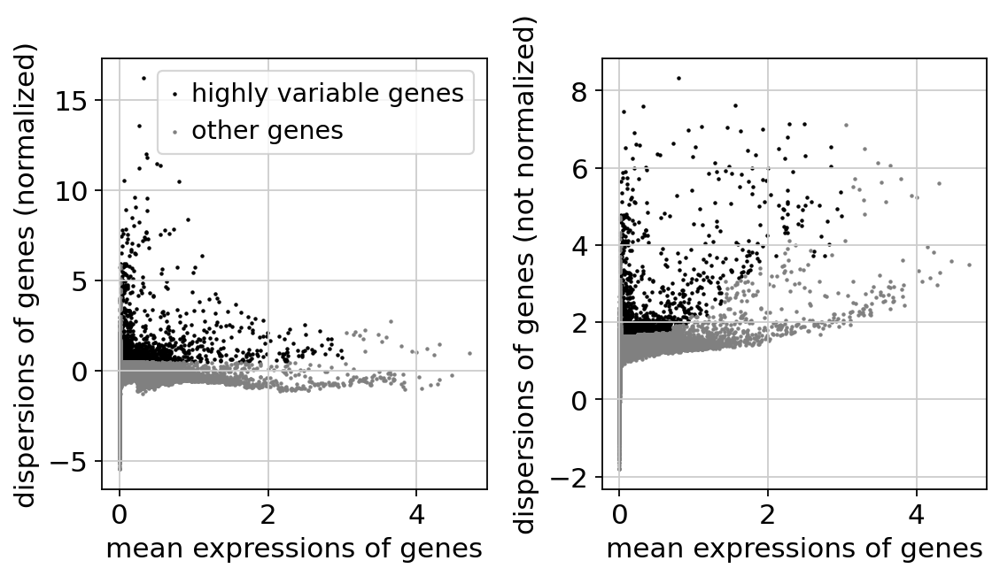

CPU times: user 412 ms, sys: 16 ms, total: 428 ms
Wall time: 427 ms


In [53]:
%%time
sc.pl.highly_variable_genes(adata)

In [54]:
adata_hvg = adata[:, adata.var['highly_variable']]

In [55]:
adata_hvg

View of AnnData object with n_obs × n_vars = 107050 × 2637
    obs: 'batch', 'bh_pval', 'cell_id', 'dataset', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'stimulation', 'technique', 'is_doublet', 'donor', 'prelim_annot', 'celltype_predictions', 'probabilities', 'S_score', 'G2M_score', 'phase'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7', 'gene_ids-8', 'feature_types-8', 'genome-8', 'n_cells-8', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'

In [56]:
%%time
sc.pp.scale(adata_hvg, max_value=10)

/opt/conda/lib/python3.7/site-packages/scanpy/preprocessing/_simple.py:806: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
CPU times: user 3.89 s, sys: 3.35 s, total: 7.24 s
Wall time: 7.24 s


________

### adding protein count stats

In [57]:
adata_raw = sc.read(save_path+'adata_raw_filtered_validation_cohort.h5ad')

In [58]:
adata_raw_protein = adata_raw[:,adata_raw.var['feature_types-0'] == 'Antibody Capture'].copy()

In [59]:
adata_raw_protein.obs['n_counts_protein'] = adata_raw_protein.X.sum(axis=1).A1

In [60]:
adata_hvg.obs['n_counts_protein'] = adata_raw_protein.obs.loc[adata_hvg.obs.index, 'n_counts_protein']

In [61]:
adata_lognorm_protein = adata_raw_protein.copy()
sc.pp.normalize_per_cell(adata_lognorm_protein, counts_per_cell_after=1e4)
sc.pp.log1p(adata_lognorm_protein)

adata_lognorm_protein.obs['n_counts_protein_lognorm'] = adata_lognorm_protein.X.sum(axis=1).A1

normalizing by total count per cell
    finished (0:00:45): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


In [62]:
adata_hvg.obs['n_counts_protein_lognorm'] = adata_lognorm_protein.obs.loc[adata_hvg.obs.index, 'n_counts_protein_lognorm']

________

## PCA

In [63]:
%%time
sc.tl.pca(adata_hvg, svd_solver='arpack', n_comps=50)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:01:44)
CPU times: user 2min 35s, sys: 3min 45s, total: 6min 21s
Wall time: 1min 44s


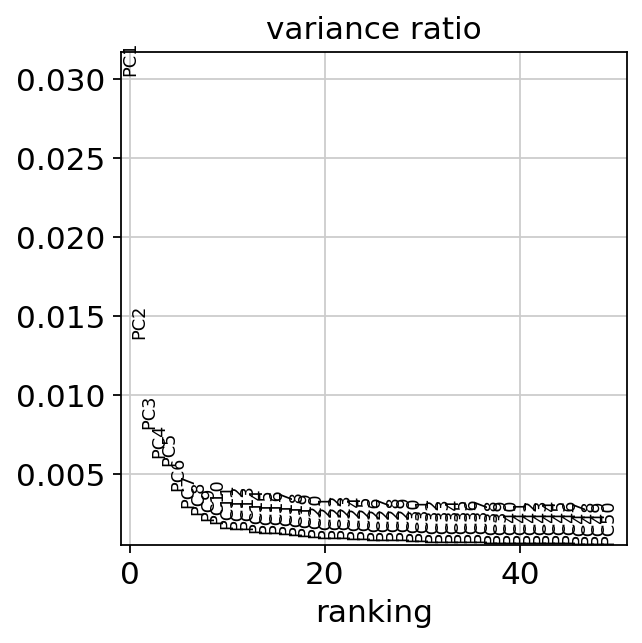

In [64]:
sc.pl.pca_variance_ratio(adata_hvg, n_pcs=50)

_______

### Neighbourhood graph & UMAP

In [152]:
%%time
sc.pp.neighbors(adata_hvg, n_neighbors=10, n_pcs=20)

computing neighbors
    using 'X_pca' with n_pcs = 20


/opt/conda/lib/python3.7/site-packages/numba/typed_passes.py:271: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../../../../opt/conda/lib/python3.7/site-packages/umap/rp_tree.py", line 135:
@numba.njit(fastmath=True, nogil=True, parallel=True)
def euclidean_random_projection_split(data, indices, rng_state):
^

  state.func_ir.loc))
/opt/conda/lib/python3.7/site-packages/numba/typed_passes.py:271: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../../../../opt/conda/lib/python3.7/site-packages/umap/nndes

    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:45)
CPU times: user 38 s, sys: 7.53 s, total: 45.6 s
Wall time: 45.5 s


### OR

BBKNN by donor


In [65]:
%%time
bbknn.bbknn(adata_hvg, batch_key='sample')

computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
	'distances', weighted adjacency matrix
	'connectivities', weighted adjacency matrix (0:00:26)
CPU times: user 26.4 s, sys: 12 ms, total: 26.4 s
Wall time: 26.4 s


/opt/conda/lib/python3.7/site-packages/bbknn/__init__.py:289: FutureWarning: This location for 'distances' is deprecated. It has been moved to .obsp[distances], and will not be accesible here in a future version of anndata.
  adata.uns['neighbors']['distances'] = bbknn_out[0]
/opt/conda/lib/python3.7/site-packages/bbknn/__init__.py:290: FutureWarning: This location for 'connectivities' is deprecated. It has been moved to .obsp[connectivities], and will not be accesible here in a future version of anndata.
  adata.uns['neighbors']['connectivities'] = bbknn_out[1]


__________________________________________________________________________________________________________________________________________________________________

In [66]:
%%time
sc.tl.umap(adata_hvg, random_state=0)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:02:40)
CPU times: user 3min 45s, sys: 1min 18s, total: 5min 3s
Wall time: 2min 40s


# Plotting

In [67]:
adata_hvg

AnnData object with n_obs × n_vars = 107050 × 2637
    obs: 'batch', 'bh_pval', 'cell_id', 'dataset', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'stimulation', 'technique', 'is_doublet', 'donor', 'prelim_annot', 'celltype_predictions', 'probabilities', 'S_score', 'G2M_score', 'phase', 'n_counts_protein', 'n_counts_protein_lognorm'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7', 'gene_ids-8', 'feature_types-8', 'genome-8', 'n_cells-8', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 

In [68]:
markers = ['CD4','CD3G', 'FOXJ1', 'IL2R', 'TRDV2', 'CD8', # T cells
                             'CD19', 'MS4A1', # B cells
                              'CD27', 'CD38', 'JCHAIN', # Plasma B cells
                             'NCAM1', 'FCGR3A', # NK celss
                             'HBB', # Erythrocytes
                             'FCGR3B', # Neutrophils
                             'CD14', 'S100A12', # Monocytes
                             'FLT3', # Dendritic cells
                             'IRF4', 'CLEC9A', # cDC1
                             'CD1C', # cDC2
                             'TNFRSF21', # pDC and IRF4
                             'CD34', # Precursors
                             'PPBP', 'TUBB1', 'PF4', # Platelets
                             'MI67', # cycling
                            ]

### BBKNN by `sample`

50 PCs

... storing 'phase' as categorical


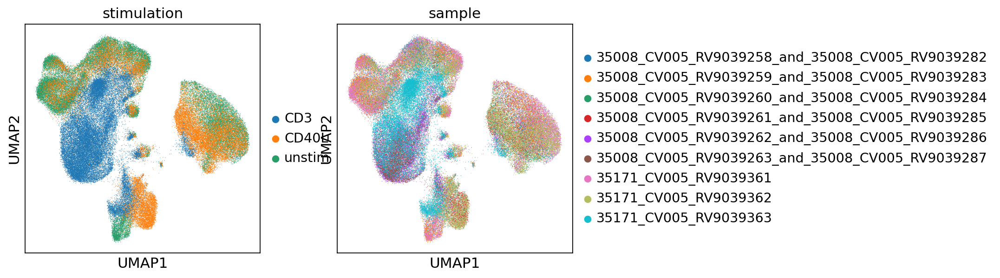

In [69]:
sc.pl.umap(adata_hvg, color=['stimulation','sample'])

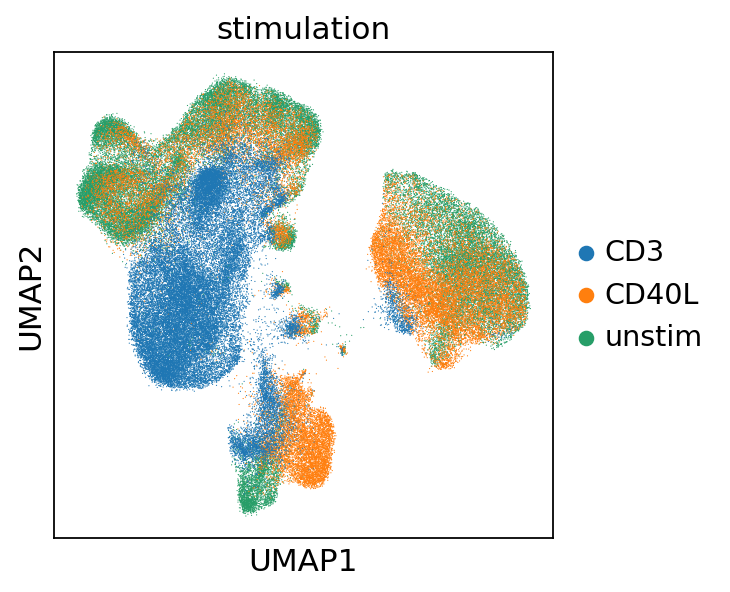

In [70]:
sc.pl.umap(adata_hvg, color=['stimulation'])

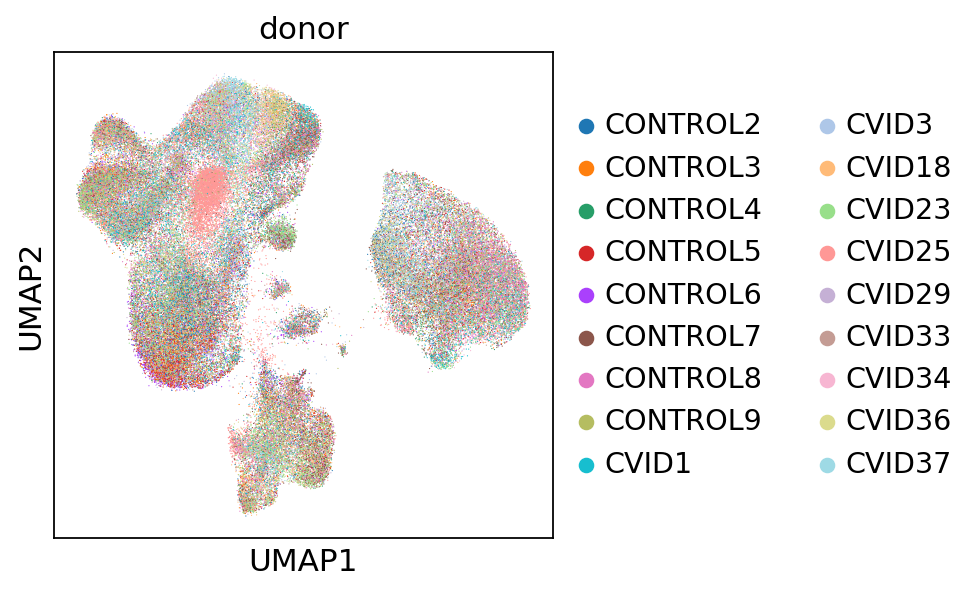

In [71]:
sc.pl.umap(adata_hvg, color=['donor'])

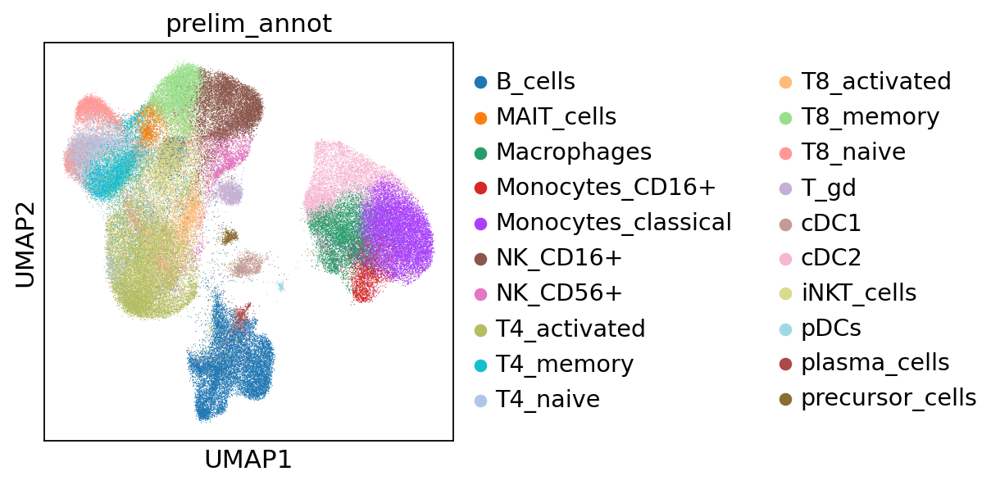

In [72]:
sc.pl.umap(adata_hvg, color=['prelim_annot'])

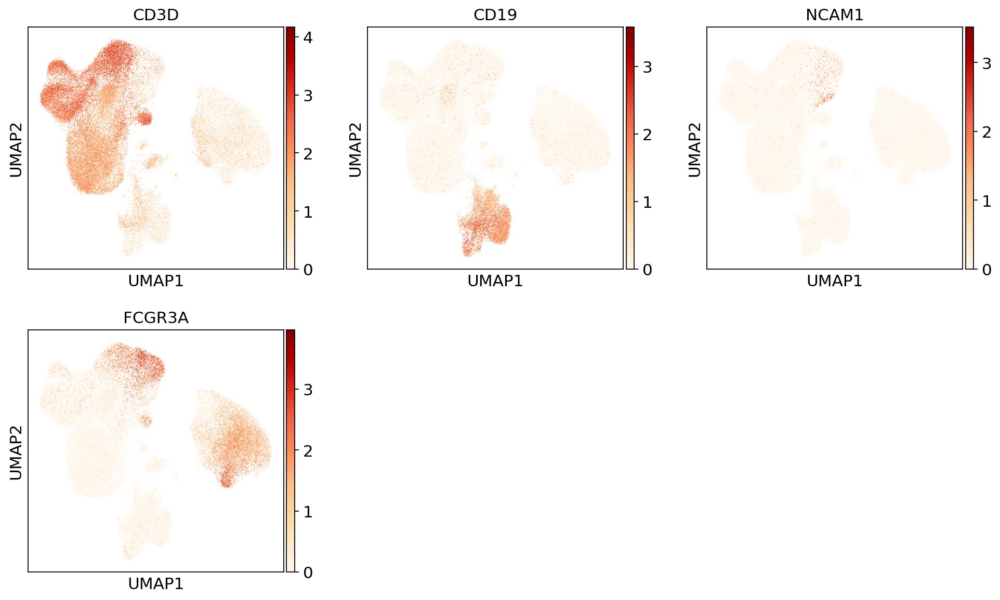

In [73]:
sc.pl.umap(adata_hvg, color=['CD3D', # T cells
                             'CD19', # B cells
                             # NK markers
                             'NCAM1', # CD56
                             'FCGR3A', # CD16
                            ], ncols=3, use_raw=True, cmap='OrRd')

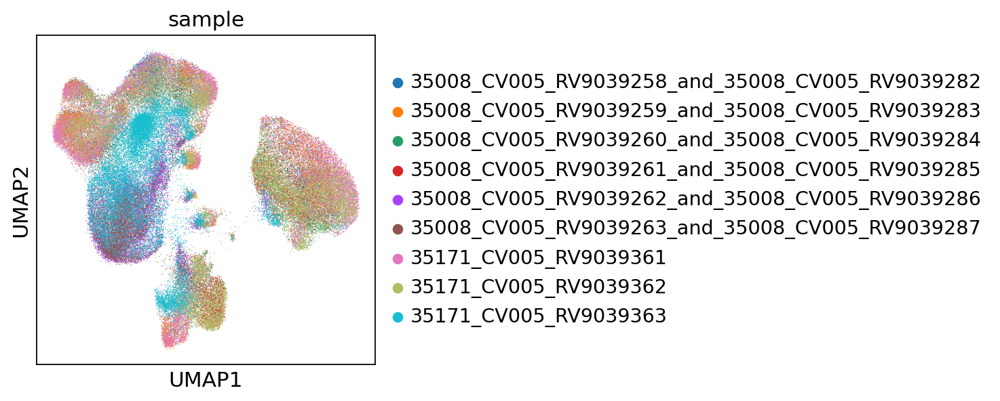

In [74]:
sc.pl.umap(adata_hvg, color=['sample'])

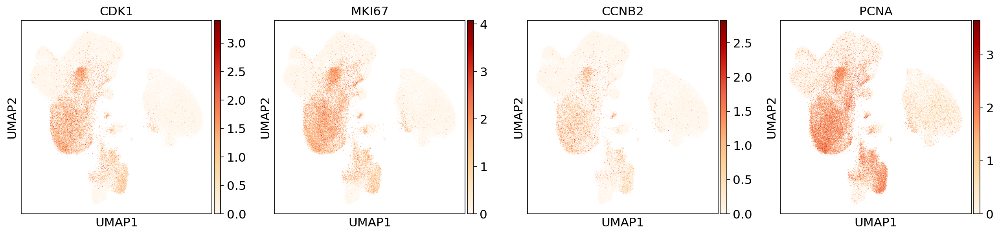

In [75]:
sc.pl.umap(adata_hvg, color=['CDK1','MKI67','CCNB2','PCNA'], cmap='OrRd')

In [76]:
adata_hvg

AnnData object with n_obs × n_vars = 107050 × 2637
    obs: 'batch', 'bh_pval', 'cell_id', 'dataset', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'stimulation', 'technique', 'is_doublet', 'donor', 'prelim_annot', 'celltype_predictions', 'probabilities', 'S_score', 'G2M_score', 'phase', 'n_counts_protein', 'n_counts_protein_lognorm'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7', 'gene_ids-8', 'feature_types-8', 'genome-8', 'n_cells-8', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 

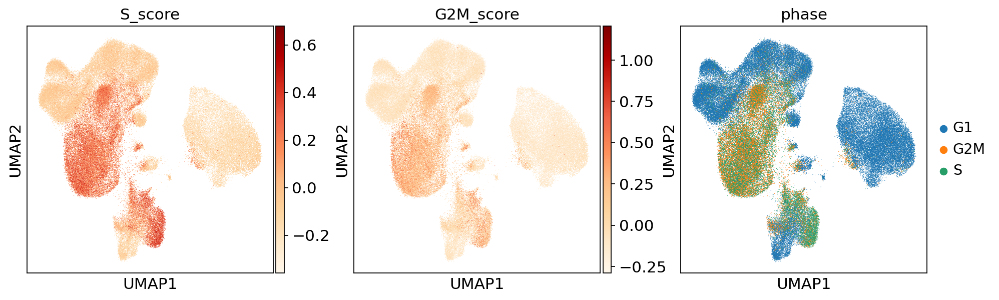

In [77]:
sc.pl.umap(adata_hvg, color=['S_score','G2M_score','phase'], cmap='OrRd')

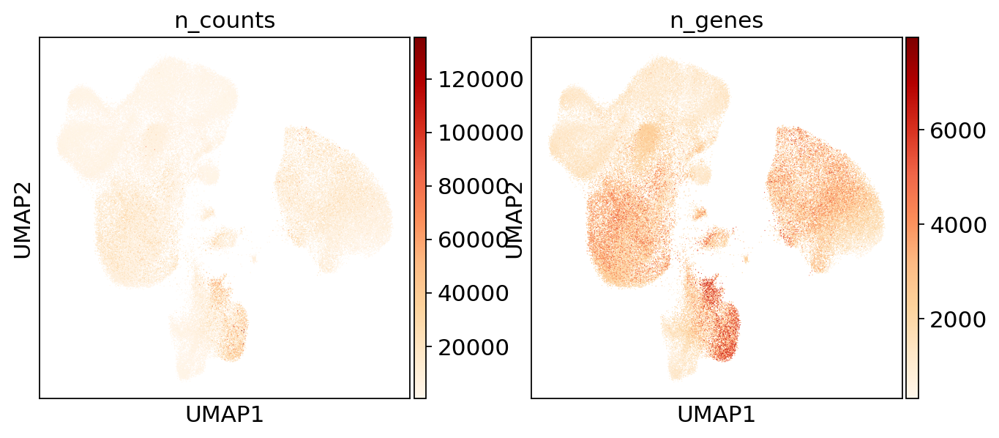

In [78]:
sc.pl.umap(adata_hvg, color=['n_counts',
                             'n_genes'], cmap='OrRd')

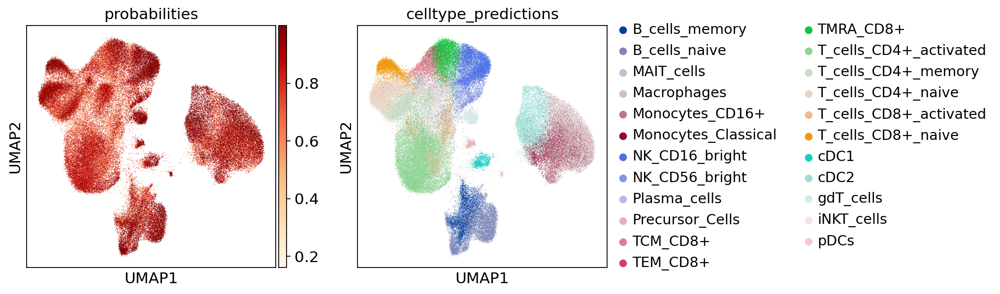

In [79]:
sc.pl.umap(adata_hvg, color=['probabilities',
                             'celltype_predictions'], cmap='OrRd')

In [80]:
# are any proteins in HVGs?
adata_prot = adata_hvg[:, adata_hvg.var['feature_types-0'] == 'Antibody Capture'].copy()
adata_prot

AnnData object with n_obs × n_vars = 107050 × 151
    obs: 'batch', 'bh_pval', 'cell_id', 'dataset', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'stimulation', 'technique', 'is_doublet', 'donor', 'prelim_annot', 'celltype_predictions', 'probabilities', 'S_score', 'G2M_score', 'phase', 'n_counts_protein', 'n_counts_protein_lognorm'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7', 'gene_ids-8', 'feature_types-8', 'genome-8', 'n_cells-8', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: '

In [81]:
adata_hvg.write(save_path+'adata_hvg_bbknn_by_sample_GEX_and_SoupX_denoised_protein_validation_cohort_20210212.h5ad')

In [6]:
adata_hvg = sc.read(save_path+'adata_hvg_bbknn_by_sample_GEX_and_SoupX_denoised_protein_validation_cohort_20210212.h5ad')

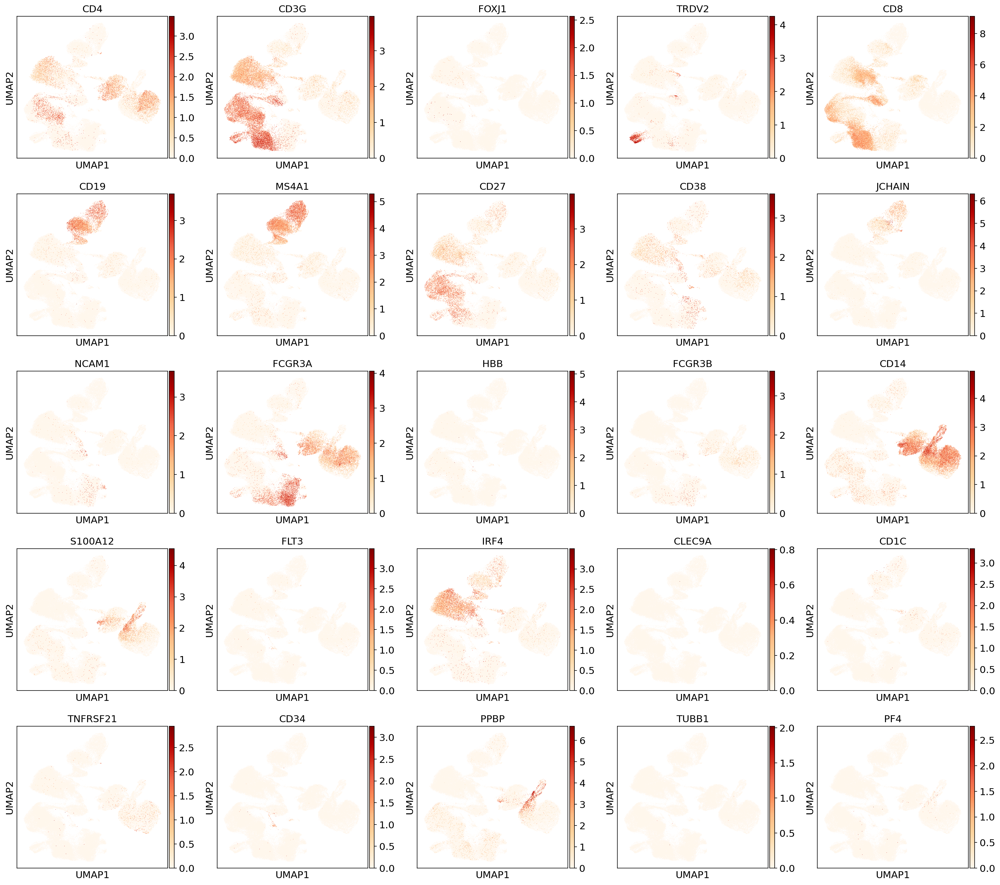

In [76]:
# old
sc.pl.umap(adata_hvg, color=[elem for elem in markers if elem in list(adata_hvg.raw.var.index)],
           use_raw=True, cmap='OrRd',
          ncols=5)

In [82]:
adata_hvg

AnnData object with n_obs × n_vars = 107050 × 2637
    obs: 'batch', 'bh_pval', 'cell_id', 'dataset', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'stimulation', 'technique', 'is_doublet', 'donor', 'prelim_annot', 'celltype_predictions', 'probabilities', 'S_score', 'G2M_score', 'phase', 'n_counts_protein', 'n_counts_protein_lognorm'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7', 'gene_ids-8', 'feature_types-8', 'genome-8', 'n_cells-8', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 

In [83]:
np.unique(adata_hvg.obs['n_counts_protein'])

array([3.70000e+01, 5.40000e+01, 5.80000e+01, ..., 1.33907e+05,
       1.55790e+05, 1.63910e+05], dtype=float32)

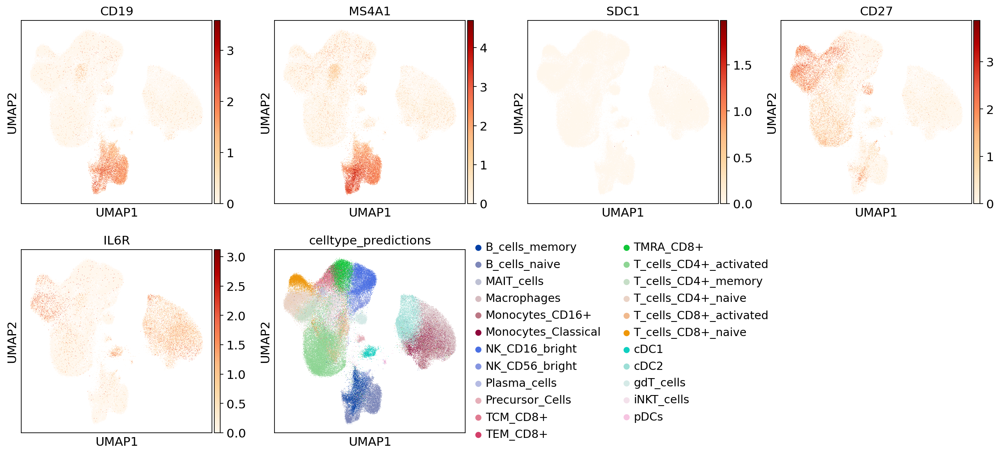

In [84]:
sc.pl.umap(adata_hvg, color=['CD19', # B cells
                                     'MS4A1', # CD20, B cells
                                     'SDC1', # CD138, Plasma cells
                                     #'CDW78', # CD78
                                     'CD27', 'IL6R', # Plasma cells
                            'celltype_predictions',
                            ], 
           cmap='OrRd'
          )

In [88]:
Abs

['CD80-1',
 'CD86-1',
 'CD274(B7-H1)',
 'CD273(B7-DC)',
 'CD275(B7-H2)',
 'CD11b',
 'CD252(OX40L)',
 'CD137L(4-1BBLigand)',
 'CD155(PVR)',
 'CD112(Nectin-2)',
 'CD47-1',
 'CD70-1',
 'CD30',
 'CD40-1',
 'CD154',
 'CD52-1',
 'CD3',
 'CD8',
 'CD56(NCAM)',
 'CD19-1',
 'CD33-1',
 'CD11c',
 'CD34-1',
 'CD269(BCMA)',
 'HLA-ABC',
 'CD90(Thy1)',
 'CD117(c-kit)',
 'CD10',
 'CD45RA',
 'CD123',
 'CD7-1',
 'CD49f',
 'CD194(CCR4)',
 'CD4-1',
 'CD44-1',
 'CD14-1',
 'CD16',
 'CD25',
 'CD45RO',
 'CD279(PD-1)',
 'TIGIT(VSTM3)',
 'Mouse_IgG1',
 'Mouse_IgG2a',
 'Mouse_IgG2b',
 'Rat_IgG2b',
 'CD20',
 'CD335(NKp46)',
 'CD294(CRTH2)',
 'CD326(Ep-CAM)',
 'CD31',
 'Podoplanin',
 'CD146',
 'CD324(E-Cadherin)',
 'IgM',
 'CD5-1',
 'TCR',
 'CD183(CXCR3)',
 'CD195(CCR5)',
 'CD32',
 'CD196(CCR6)',
 'CD185(CXCR5)',
 'CD103(IntegrinaE)',
 'CD69-1',
 'CD62L',
 'CD197(CCR7)',
 'CD161',
 'CD152(CTLA-4)',
 'CD223(LAG-3)',
 'KLRG1(MAFA)',
 'CD27-1',
 'CD107a(LAMP-1)',
 'CD95(Fas)',
 'HLA-DR',
 'CD1c',
 'CD64',
 'CD141(Thro

In [90]:
Abs = list(adata_hvg.raw.var[adata_hvg.raw.var['feature_types-0'] == 'Antibody Capture'].index)

In [ ]:
%%time

# this plot is saved into: ./figures/umap__denoised_SoupX_protein_counts_normlog_on_GEX_and_SoupX_denoised_manifold_validation_cohort_20210212.pdf
# takes about 9 minutes to plot this

sc.pl.umap(adata_hvg, color = Abs + ['stimulation','probabilities','celltype_predictions','prelim_annot'], 
           cmap='OrRd', ncols=5, use_raw=True,
           save = '_denoised_SoupX_protein_counts_normlog_on_GEX_and_SoupX_denoised_manifold_validation_cohort_20210212.pdf')

In [93]:
# after reading the BBKNN object
adata_hvg

AnnData object with n_obs × n_vars = 107050 × 2637
    obs: 'batch', 'bh_pval', 'cell_id', 'dataset', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'stimulation', 'technique', 'is_doublet', 'donor', 'prelim_annot', 'celltype_predictions', 'probabilities', 'S_score', 'G2M_score', 'phase', 'n_counts_protein', 'n_counts_protein_lognorm'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7', 'gene_ids-8', 'feature_types-8', 'genome-8', 'n_cells-8', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 

In [94]:
np.unique(adata_hvg.obs['n_counts_protein'])

array([3.70000e+01, 5.40000e+01, 5.80000e+01, ..., 1.33907e+05,
       1.55790e+05, 1.63910e+05], dtype=float32)

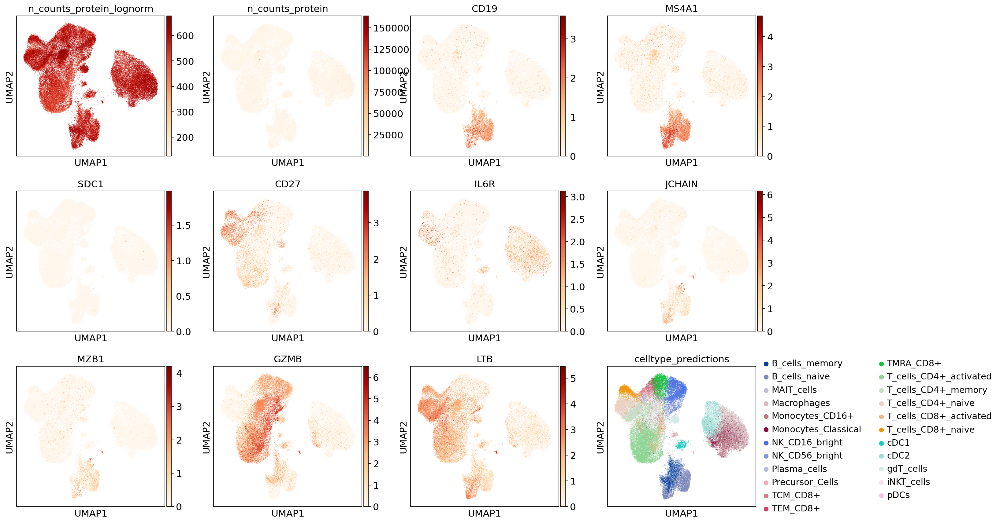

In [96]:
sc.pl.umap(adata_hvg, color=['n_counts_protein_lognorm',
                             'n_counts_protein',
                             'CD19', # B cells
                             'MS4A1', # CD20, B cells
                             'SDC1', # CD138, Plasma cells
                             #'CDW78', # CD78
                             'CD27', 'IL6R', # Plasma cells
                             'JCHAIN', 'MZB1', # Plasma cells
                             'GZMB', 'LTB', # expr in pDC but not Plasma cells
                             'celltype_predictions',
                            ], 
           cmap='OrRd'
          )

### Unbiased clustering

In [7]:
%%time
sc.tl.louvain(adata_hvg, resolution=2.0)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 22 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:33)
CPU times: user 31.7 s, sys: 2.57 s, total: 34.2 s
Wall time: 34.2 s


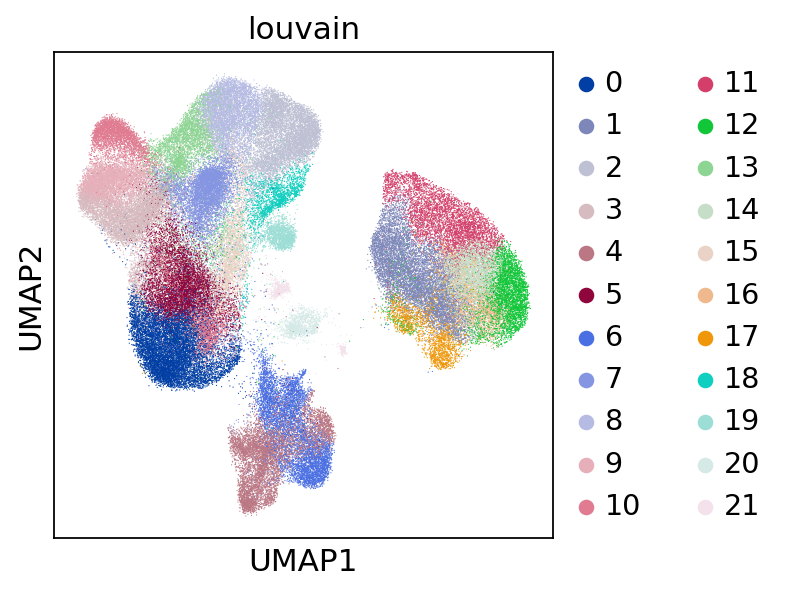

In [8]:
sc.pl.umap(adata_hvg, color=['louvain'])

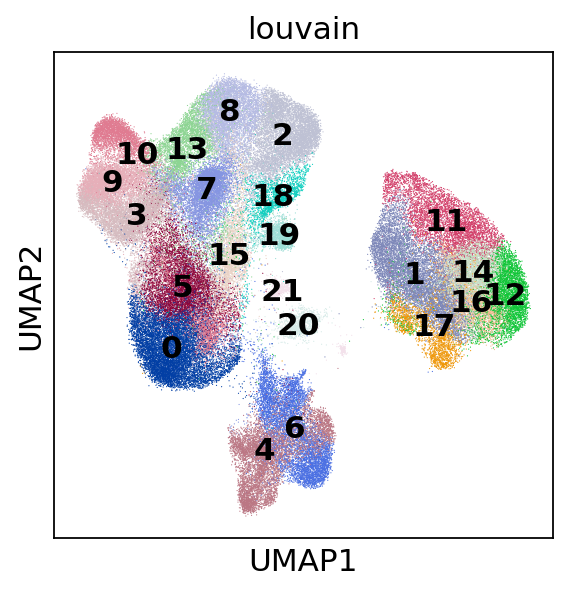

In [9]:
sc.pl.umap(adata_hvg, color=['louvain'], legend_loc='on data')

In [21]:
# zoom in clustering of B cells
sc.tl.louvain(adata_hvg, resolution=1.0, restrict_to = ('louvain',['4','6']),
             key_added='louvain_R_4_6')

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 29 clusters and added
    'louvain_R_4_6', the cluster labels (adata.obs, categorical) (0:00:01)


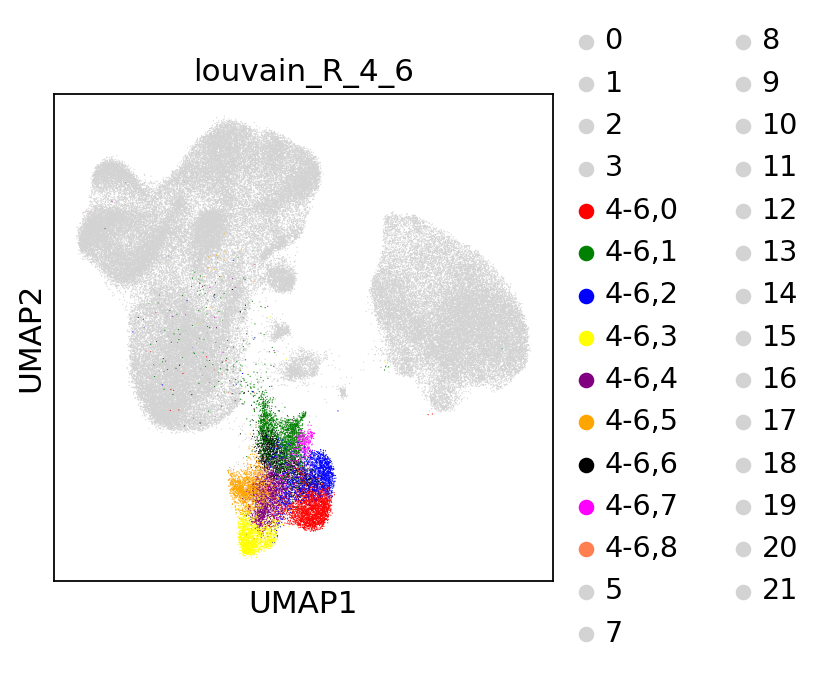

In [22]:
sc.pl.umap(adata_hvg, color=['louvain_R_4_6'],
          palette=['lightgrey']*4 + ['red','green','blue','yellow', 'purple',
                                     'orange','black', 
                                     'magenta', 
                                     'coral'
                                    ] + ['lightgrey']*16)

In [99]:
len(Abs)

192

In [100]:
for Ab in Abs:
    if 'CD45' in Ab:
        print(Abs.index(Ab))
        print(Ab)

28
CD45RA
38
CD45RO
133
CD45


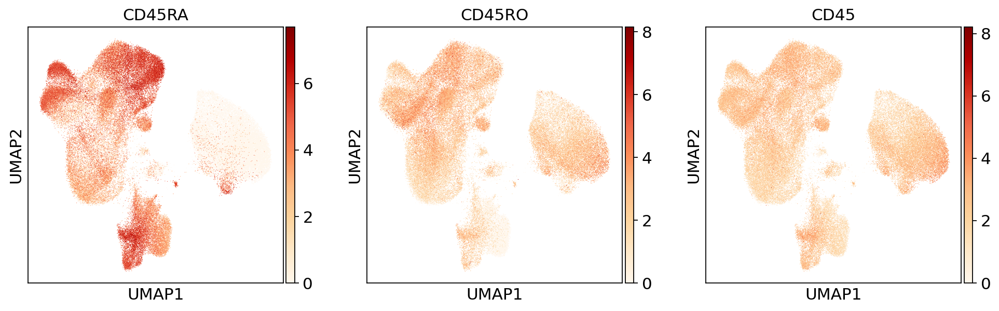

In [101]:
sc.pl.umap(adata_hvg, color=['CD45RA','CD45RO','CD45'], cmap='OrRd',
          )

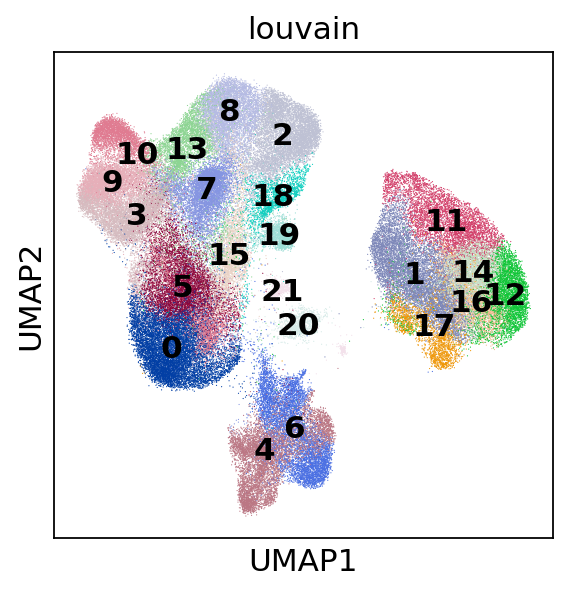

In [102]:
sc.pl.umap(adata_hvg, color=['louvain'], legend_loc = 'on data')

In [103]:
adata_hvg

AnnData object with n_obs × n_vars = 107050 × 2637
    obs: 'batch', 'bh_pval', 'cell_id', 'dataset', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'stimulation', 'technique', 'is_doublet', 'donor', 'prelim_annot', 'celltype_predictions', 'probabilities', 'S_score', 'G2M_score', 'phase', 'n_counts_protein', 'n_counts_protein_lognorm', 'louvain'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7', 'gene_ids-8', 'feature_types-8', 'genome-8', 'n_cells-8', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std

## Preparing the object for cellxgene

In [104]:
# in raw are the normalised and log transformed GEX counts + normalised and log transformed SoupX-denoised protein counts
adata_full = anndata.AnnData(X=adata_hvg.raw.X,
                            obs=adata_hvg.obs,
                            var=adata_hvg.raw.var,
                            obsm=adata_hvg.obsm)

In [105]:
adata_full

AnnData object with n_obs × n_vars = 107050 × 21749
    obs: 'batch', 'bh_pval', 'cell_id', 'dataset', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'stimulation', 'technique', 'is_doublet', 'donor', 'prelim_annot', 'celltype_predictions', 'probabilities', 'S_score', 'G2M_score', 'phase', 'n_counts_protein', 'n_counts_protein_lognorm', 'louvain'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7', 'gene_ids-8', 'feature_types-8', 'genome-8', 'n_cells-8'
    obsm: 'X_pca', 'X_umap'

In [106]:
# get all the clinical metadata
metadata = pd.read_csv('./metadata/Supp_Table2_clinical_information LdPM.csv', header=1, index_col=0)

In [107]:
metadata

,CVID1,CVID3,CVID18,CVID23,CVID25,CVID29,CVID33,CVID34,CVID36,CVID37,...,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10
Age,66,34,33,50,34,22,36,66,31,42,...,19,42,34,52,37,33,37,31,28,31
Sex,female,male,male,male,male,male,male,male,male,male,...,female,male,male,male,female,female,male,male,female,male
Age of disease onset,30,4,19,21,4,8,31,64,25,40,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Autoimmunity,Yes (vitiligo),No,Yes (celiac disease),No,No,No,Yes (diabetes),Yes (ITP),No,Yes (ITP),...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Gastrointestinal disease,No,No,Yes,No,No,No,No,Yes,No,No,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Lung disease (bronchiectasis),Yes,Yes,No,No,Yes,No,No,Yes,Yes,No,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Lymphoadenopathy,Yes,No,Yes,Yes,Yes,No,Yes,Yes,No,Yes,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Splenomegaly,Yes,No,Yes,Yes,Yes,No,Yes,Yes,Yes,No,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
"History of hypogammaglobulinemia, IgA deficiency or immunodeficiency in other family members",No,No,No,No,No,"Yes, mother IgA deficiency",No,No,No,No,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [108]:
metadata.columns

Index(['CVID1 ', 'CVID3', 'CVID18', 'CVID23', 'CVID25', 'CVID29', 'CVID33',
       'CVID34', 'CVID36', 'CVID37', 'CVID twin', 'Control twin', 'C1', 'C2',
       'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10'],
      dtype='object')

In [109]:
new_columns = ['CVID1', 'CVID3', 'CVID18', 'CVID23', 'CVID25', 'CVID29', 'CVID33',
       'CVID34', 'CVID36', 'CVID37', 'CVID_twin', 'CONTROL_twin', 'CONTROL1', 'CONTROL2',
       'CONTROL3', 'CONTROL4', 'CONTROL5', 'CONTROL6', 'CONTROL7', 'CONTROL8', 'CONTROL9', 'CONTROL10']
metadata.columns = new_columns

In [110]:
metadata

,CVID1,CVID3,CVID18,CVID23,CVID25,CVID29,CVID33,CVID34,CVID36,CVID37,...,CONTROL1,CONTROL2,CONTROL3,CONTROL4,CONTROL5,CONTROL6,CONTROL7,CONTROL8,CONTROL9,CONTROL10
Age,66,34,33,50,34,22,36,66,31,42,...,19,42,34,52,37,33,37,31,28,31
Sex,female,male,male,male,male,male,male,male,male,male,...,female,male,male,male,female,female,male,male,female,male
Age of disease onset,30,4,19,21,4,8,31,64,25,40,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Autoimmunity,Yes (vitiligo),No,Yes (celiac disease),No,No,No,Yes (diabetes),Yes (ITP),No,Yes (ITP),...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Gastrointestinal disease,No,No,Yes,No,No,No,No,Yes,No,No,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Lung disease (bronchiectasis),Yes,Yes,No,No,Yes,No,No,Yes,Yes,No,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Lymphoadenopathy,Yes,No,Yes,Yes,Yes,No,Yes,Yes,No,Yes,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Splenomegaly,Yes,No,Yes,Yes,Yes,No,Yes,Yes,Yes,No,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
"History of hypogammaglobulinemia, IgA deficiency or immunodeficiency in other family members",No,No,No,No,No,"Yes, mother IgA deficiency",No,No,No,No,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [111]:
metadata.index

Index([                                                                                         'Age',
                                                                                                'Sex',
                                                                               'Age of disease onset',
                                                                                       'Autoimmunity',
                                                                           'Gastrointestinal disease',
                                                                      'Lung disease (bronchiectasis)',
                                                                                  'Lymphoadenopathy ',
                                                                                       'Splenomegaly',
       'History of hypogammaglobulinemia, IgA deficiency or immunodeficiency in other family members',
                                                                         

In [112]:
# dropping rows with only nans
rows2keep = [                                                                                         'Age',
                                                                                                'Sex',
                                                                               'Age of disease onset',
                                                                                       'Autoimmunity',
                                                                           'Gastrointestinal disease',
                                                                      'Lung disease (bronchiectasis)',
                                                                                  'Lymphoadenopathy ',
                                                                                       'Splenomegaly',
       'History of hypogammaglobulinemia, IgA deficiency or immunodeficiency in other family members']


metadata = metadata.loc[rows2keep,:]

In [113]:
metadata

,CVID1,CVID3,CVID18,CVID23,CVID25,CVID29,CVID33,CVID34,CVID36,CVID37,...,CONTROL1,CONTROL2,CONTROL3,CONTROL4,CONTROL5,CONTROL6,CONTROL7,CONTROL8,CONTROL9,CONTROL10
Age,66,34,33,50,34,22,36,66,31,42,...,19,42,34,52,37,33,37,31,28,31
Sex,female,male,male,male,male,male,male,male,male,male,...,female,male,male,male,female,female,male,male,female,male
Age of disease onset,30,4,19,21,4,8,31,64,25,40,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Autoimmunity,Yes (vitiligo),No,Yes (celiac disease),No,No,No,Yes (diabetes),Yes (ITP),No,Yes (ITP),...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Gastrointestinal disease,No,No,Yes,No,No,No,No,Yes,No,No,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Lung disease (bronchiectasis),Yes,Yes,No,No,Yes,No,No,Yes,Yes,No,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Lymphoadenopathy,Yes,No,Yes,Yes,Yes,No,Yes,Yes,No,Yes,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Splenomegaly,Yes,No,Yes,Yes,Yes,No,Yes,Yes,Yes,No,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
"History of hypogammaglobulinemia, IgA deficiency or immunodeficiency in other family members",No,No,No,No,No,"Yes, mother IgA deficiency",No,No,No,No,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [114]:
def add_clinical_metadata(adata_obj, barcode, clinical_meta_row):
    
    curr_donor = adata_obj.obs.loc[barcode, 'donor']
    
    value = metadata.loc[clinical_meta_row, curr_donor]
    
    return(value)
    

In [116]:
adata_full.obs['barcode'] = adata_full.obs.index

In [117]:
for col2add in metadata.index:
    print(col2add)
    adata_full.obs[col2add] = adata_full.obs['barcode'].apply(lambda x: add_clinical_metadata(adata_full, x, col2add))

Age
Sex
Age of disease onset
Autoimmunity
Gastrointestinal disease
Lung disease (bronchiectasis)
Lymphoadenopathy 
Splenomegaly
History of hypogammaglobulinemia, IgA deficiency or immunodeficiency in other family members


In [118]:
np.unique(adata_full.obs['donor'])

array(['CONTROL2', 'CONTROL3', 'CONTROL4', 'CONTROL5', 'CONTROL6',
       'CONTROL7', 'CONTROL8', 'CONTROL9', 'CVID1', 'CVID18', 'CVID23',
       'CVID25', 'CVID29', 'CVID3', 'CVID33', 'CVID34', 'CVID36',
       'CVID37'], dtype=object)

In [119]:
# also adding general key of CVID status
adata_full.obs['CVID_status'] = ['CVID' if 'CVID' in donor else 'CONTROL' for donor in adata_full.obs['donor']]

... storing 'Age' as categorical
... storing 'Sex' as categorical
... storing 'Age of disease onset' as categorical
... storing 'Autoimmunity' as categorical
... storing 'Gastrointestinal disease' as categorical
... storing 'Lung disease (bronchiectasis)' as categorical
... storing 'Lymphoadenopathy ' as categorical
... storing 'Splenomegaly' as categorical
... storing 'History of hypogammaglobulinemia, IgA deficiency or immunodeficiency in other family members' as categorical
... storing 'CVID_status' as categorical


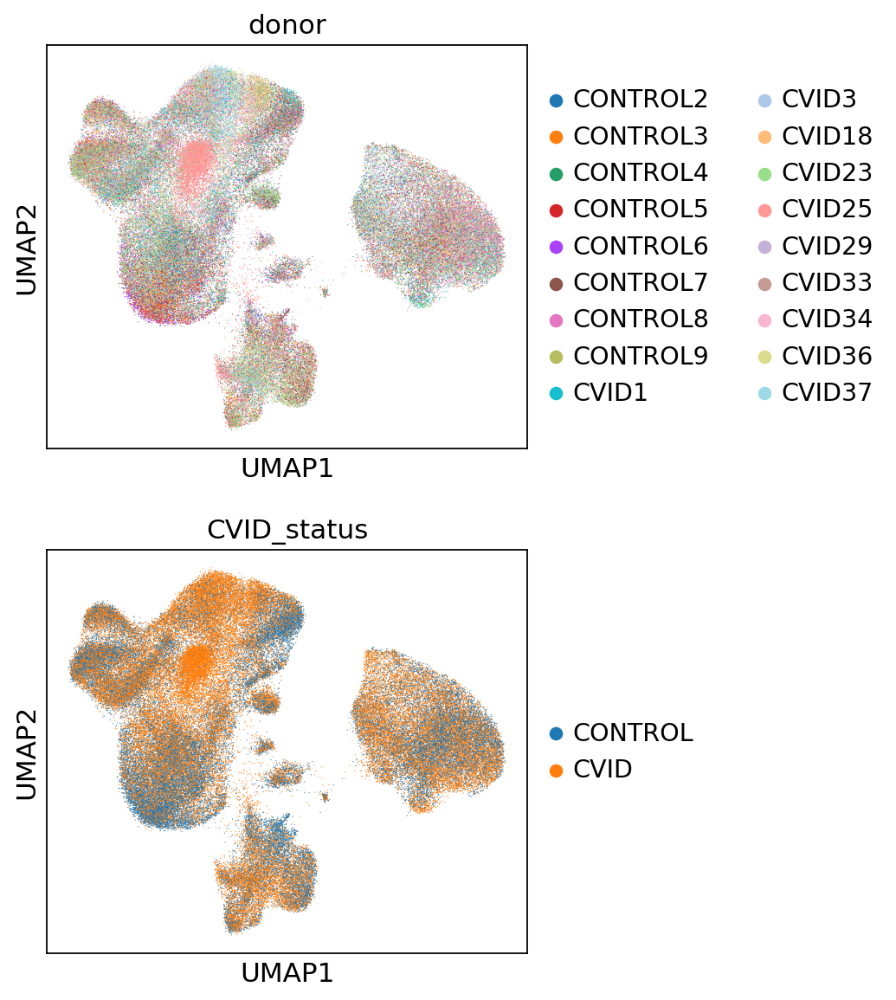

In [120]:
sc.pl.umap(adata_full, color=['donor','CVID_status'], ncols=1)

In [121]:
import scipy
adata_full.X = scipy.sparse.csc_matrix(adata_full.X)


In [122]:
adata_full.obs.columns

Index(['batch', 'bh_pval', 'cell_id', 'dataset', 'n_counts', 'n_genes',
       'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score',
       'stimulation', 'technique', 'is_doublet', 'donor', 'prelim_annot',
       'celltype_predictions', 'probabilities', 'S_score', 'G2M_score',
       'phase', 'n_counts_protein', 'n_counts_protein_lognorm', 'louvain',
       'barcode', 'Age', 'Sex', 'Age of disease onset', 'Autoimmunity',
       'Gastrointestinal disease', 'Lung disease (bronchiectasis)',
       'Lymphoadenopathy ', 'Splenomegaly',
       'History of hypogammaglobulinemia, IgA deficiency or immunodeficiency in other family members',
       'CVID_status'],
      dtype='object')

In [123]:
categ_columns = ['batch',  'sample',
       'stimulation', 'donor', 'prelim_annot',
       'celltype_predictions', 
       'phase',  'louvain',
       'Age', 'Sex', 'Age of disease onset', 'Autoimmunity',
       'Gastrointestinal disease', 'Lung disease (bronchiectasis)',
       'Lymphoadenopathy ', 'Splenomegaly',
       'History of hypogammaglobulinemia, IgA deficiency or immunodeficiency in other family members',
       'CVID_status'
                ]


cont_columns = ['n_counts', 'n_genes',
       'percent_mito', 'scrublet_cluster_score', 'scrublet_score',
                'probabilities', 'S_score', 'G2M_score',
                'n_counts_protein', 'n_counts_protein_lognorm',
               ]


In [124]:
import pandas
for column in categ_columns:
    adata_full.obs[column] = pd.Categorical(adata_full.obs[column])
    
for column in cont_columns:
    adata_full.obs[column] = np.float32(adata_full.obs[column])

In [125]:
Abs = adata_full.var[adata_full.var['feature_types-0'] == 'Antibody Capture'].index

In [126]:
len(Abs)

192

In [127]:
new_var_names = [elem + '_protein' if elem in Abs else elem for elem in adata_full.var_names]

In [128]:
for elem in new_var_names:
    if '_protein' in elem:
        print(elem)

CD80-1_protein
CD86-1_protein
CD274(B7-H1)_protein
CD273(B7-DC)_protein
CD275(B7-H2)_protein
CD11b_protein
CD252(OX40L)_protein
CD137L(4-1BBLigand)_protein
CD155(PVR)_protein
CD112(Nectin-2)_protein
CD47-1_protein
CD70-1_protein
CD30_protein
CD40-1_protein
CD154_protein
CD52-1_protein
CD3_protein
CD8_protein
CD56(NCAM)_protein
CD19-1_protein
CD33-1_protein
CD11c_protein
CD34-1_protein
CD269(BCMA)_protein
HLA-ABC_protein
CD90(Thy1)_protein
CD117(c-kit)_protein
CD10_protein
CD45RA_protein
CD123_protein
CD7-1_protein
CD49f_protein
CD194(CCR4)_protein
CD4-1_protein
CD44-1_protein
CD14-1_protein
CD16_protein
CD25_protein
CD45RO_protein
CD279(PD-1)_protein
TIGIT(VSTM3)_protein
Mouse_IgG1_protein
Mouse_IgG2a_protein
Mouse_IgG2b_protein
Rat_IgG2b_protein
CD20_protein
CD335(NKp46)_protein
CD294(CRTH2)_protein
CD326(Ep-CAM)_protein
CD31_protein
Podoplanin_protein
CD146_protein
CD324(E-Cadherin)_protein
IgM_protein
CD5-1_protein
TCR_protein
CD183(CXCR3)_protein
CD195(CCR5)_protein
CD32_protein
CD

In [129]:
adata_full.var_names = new_var_names

In [130]:
adata_full.var.index = new_var_names

In [131]:
adata_full.write(save_path+'adata_for_cellxgene_GEX_and_SoupX_denoised_protein_BBKNN_validation_cohort_20210212.h5ad')

In [132]:
save_path+'adata_for_cellxgene_GEX_and_SoupX_denoised_protein_BBKNN_validation_cohort_20210212.h5ad'

'/lustre/scratch117/cellgen/team292/aa22/adata_objects/202009_CVID_revision/adata_for_cellxgene_GEX_and_SoupX_denoised_protein_BBKNN_validation_cohort_20210212.h5ad'

In [133]:
adata_full

AnnData object with n_obs × n_vars = 107050 × 21749
    obs: 'batch', 'bh_pval', 'cell_id', 'dataset', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'stimulation', 'technique', 'is_doublet', 'donor', 'prelim_annot', 'celltype_predictions', 'probabilities', 'S_score', 'G2M_score', 'phase', 'n_counts_protein', 'n_counts_protein_lognorm', 'louvain', 'barcode', 'Age', 'Sex', 'Age of disease onset', 'Autoimmunity', 'Gastrointestinal disease', 'Lung disease (bronchiectasis)', 'Lymphoadenopathy ', 'Splenomegaly', 'History of hypogammaglobulinemia, IgA deficiency or immunodeficiency in other family members', 'CVID_status'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5',